In [ ]:
%pip install geopandas
%pip install geodatasets
%pip install geopandas folium mapclassify

df download link: https://www.kaggle.com/datasets/fedesoriano/california-housing-prices-data-extra-features

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import pandas as pd
import geopandas as gpd
import geodatasets
from shapely.geometry import Point
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import folium
from branca.colormap import LinearColormap
from folium.plugins import MarkerCluster
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, mean_squared_error, r2_score

In [5]:
df_hprices = pd.read_csv('/content/drive/MyDrive/house prices predict/dataset/California_Houses.csv')
display(df_hprices)

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
0,452600.0,8.3252,41,880,129,322,126,37.88,-122.23,9263.040773,556529.158342,735501.806984,67432.517001,21250.213767
1,358500.0,8.3014,21,7099,1106,2401,1138,37.86,-122.22,10225.733072,554279.850069,733236.884360,65049.908574,20880.600400
2,352100.0,7.2574,52,1467,190,496,177,37.85,-122.24,8259.085109,554610.717069,733525.682937,64867.289833,18811.487450
3,341300.0,5.6431,52,1274,235,558,219,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568
4,342200.0,3.8462,52,1627,280,565,259,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,78100.0,1.5603,25,1665,374,845,330,39.48,-121.09,162031.481121,654530.186299,830631.543047,248510.058162,222619.890417
20636,77100.0,2.5568,18,697,150,356,114,39.49,-121.21,160445.433537,659747.068444,836245.915229,246849.888948,218314.424634
20637,92300.0,1.7000,17,2254,485,1007,433,39.43,-121.22,153754.341182,654042.214020,830699.573163,240172.220489,212097.936232
20638,84700.0,1.8672,18,1860,409,741,349,39.43,-121.32,152005.022239,657698.007703,834672.461887,238193.865909,207923.199166


# Data cleaning and analysis

In [6]:
#df_hprices = df_hprices.drop(['Latitude', 'Longitude'], axis=1)
#display(df_hprices.head(2))

In [7]:
df_hprices['Mean_Rooms_Per_Unit'] = df_hprices['Tot_Rooms'] / df_hprices["Households"]
display(df_hprices.head(2))

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco,Mean_Rooms_Per_Unit
0,452600.0,8.3252,41,880,129,322,126,37.88,-122.23,9263.040773,556529.158342,735501.806984,67432.517001,21250.213767,6.984127
1,358500.0,8.3014,21,7099,1106,2401,1138,37.86,-122.22,10225.733072,554279.850069,733236.884360,65049.908574,20880.600400,6.238137


let's categorize house prices into 5 categories:
0-100000; 100001-200000;
200001-300000;
300001-400000;
400001-...

In [8]:
bins = [0, 50000, 100000, 150000, 200000, 250000, 300000, 350000, 400000, 450000, float('inf')]
labels = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

df_hprices['House_Value_Category'] = pd.cut(df_hprices['Median_House_Value'], bins=bins, labels=labels)

df_hprices['House_Value_Category'] = df_hprices['House_Value_Category'].astype(int)

display(df_hprices.head(5))

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco,Mean_Rooms_Per_Unit,House_Value_Category
0,452600.0,8.3252,41,880,129,322,126,37.88,-122.23,9263.040773,556529.158342,735501.806984,67432.517001,21250.213767,6.984127,10
1,358500.0,8.3014,21,7099,1106,2401,1138,37.86,-122.22,10225.733072,554279.850069,733236.884360,65049.908574,20880.600400,6.238137,8
2,352100.0,7.2574,52,1467,190,496,177,37.85,-122.24,8259.085109,554610.717069,733525.682937,64867.289833,18811.487450,8.288136,8
3,341300.0,5.6431,52,1274,235,558,219,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568,5.817352,7
4,342200.0,3.8462,52,1627,280,565,259,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568,6.281853,7


In [9]:
df_hprices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Median_House_Value        20640 non-null  float64
 1   Median_Income             20640 non-null  float64
 2   Median_Age                20640 non-null  int64  
 3   Tot_Rooms                 20640 non-null  int64  
 4   Tot_Bedrooms              20640 non-null  int64  
 5   Population                20640 non-null  int64  
 6   Households                20640 non-null  int64  
 7   Latitude                  20640 non-null  float64
 8   Longitude                 20640 non-null  float64
 9   Distance_to_coast         20640 non-null  float64
 10  Distance_to_LA            20640 non-null  float64
 11  Distance_to_SanDiego      20640 non-null  float64
 12  Distance_to_SanJose       20640 non-null  float64
 13  Distance_to_SanFrancisco  20640 non-null  float64
 14  Mean_R

In [10]:
# null cells verification
df_hprices.isnull().sum()

Median_House_Value          0
Median_Income               0
Median_Age                  0
Tot_Rooms                   0
Tot_Bedrooms                0
Population                  0
Households                  0
Latitude                    0
Longitude                   0
Distance_to_coast           0
Distance_to_LA              0
Distance_to_SanDiego        0
Distance_to_SanJose         0
Distance_to_SanFrancisco    0
Mean_Rooms_Per_Unit         0
House_Value_Category        0
dtype: int64

This data set is good to start geting some relations between its content.

In [11]:

df_desc = df_hprices.describe()
display(df_desc)

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco,Mean_Rooms_Per_Unit,House_Value_Category
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,2.064000e+04,2.064000e+04,20640.000000,20640.000000,20640.000000,20640.000000
mean,206855.816909,3.870671,28.639486,2635.763081,537.898014,1425.476744,499.539680,35.631861,-119.569704,40509.264883,2.694220e+05,3.981649e+05,349187.551219,386688.422291,5.429000,4.601405
std,115395.615874,1.899822,12.585558,2181.615252,421.247906,1132.462122,382.329753,2.135952,2.003532,49140.039160,2.477324e+05,2.894006e+05,217149.875026,250122.192316,2.474173,2.254978
min,14999.000000,0.499900,1.000000,2.000000,1.000000,3.000000,1.000000,32.540000,-124.350000,120.676447,4.205891e+02,4.849180e+02,569.448118,456.141313,0.846154,1.000000
25%,119600.000000,2.563400,18.000000,1447.750000,295.000000,787.000000,280.000000,33.930000,-121.800000,9079.756762,3.211125e+04,1.594264e+05,113119.928682,117395.477505,4.440716,3.000000
50%,179700.000000,3.534800,29.000000,2127.000000,435.000000,1166.000000,409.000000,34.260000,-118.490000,20522.019101,1.736675e+05,2.147398e+05,459758.877000,526546.661701,5.229129,4.000000
75%,264725.000000,4.743250,37.000000,3148.000000,647.000000,1725.000000,605.000000,37.710000,-118.010000,49830.414479,5.271562e+05,7.057954e+05,516946.490963,584552.007907,6.052381,6.000000
max,500001.000000,15.000100,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,41.950000,-114.310000,333804.686371,1.018260e+06,1.196919e+06,836762.678210,903627.663298,141.909091,10.000000


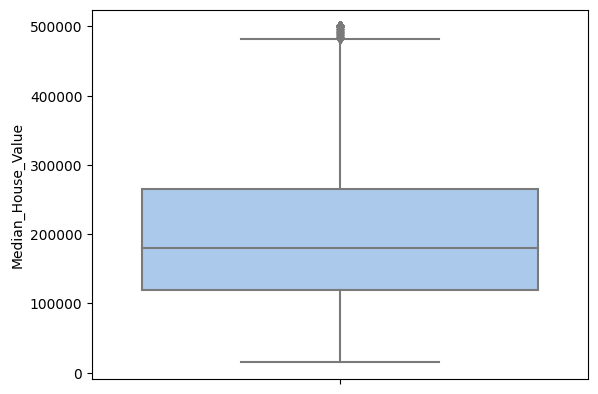

In [12]:
# Median House Values concentration
fig = sns.boxplot(data=df_hprices, y="Median_House_Value", orient="v", palette = sns.color_palette("pastel"))
plt.show(fig)

In [13]:
p01 = df_hprices["Median_House_Value"].quantile(0.01)
p05 = df_hprices["Median_House_Value"].quantile(0.05)
p10 = df_hprices["Median_House_Value"].quantile(0.10)
p90 = df_hprices["Median_House_Value"].quantile(0.90)
p95 = df_hprices["Median_House_Value"].quantile(0.95)
p97 = df_hprices["Median_House_Value"].quantile(0.97)
p98 = df_hprices["Median_House_Value"].quantile(0.98)
p99 = df_hprices["Median_House_Value"].quantile(0.99)

print("\n","p01:", p01, "\n", "p05:", p05,"\n","p10:", p10,"\n",
      "p90:", p90,"\n","p95:", p95,
      "\n","p97:", p97,
      "\n","p98:", p98,
      "\n","p99:", p99)


 p01: 50000.0 
 p05: 66200.0 
 p10: 82300.0 
 p90: 376600.0 
 p95: 489809.9999999999 
 p97: 500001.0 
 p98: 500001.0 
 p99: 500001.0


We have some values ​​following a different pattern, but I don't see them as outliers. They can be attributed to more luxurious properties in the observed region.

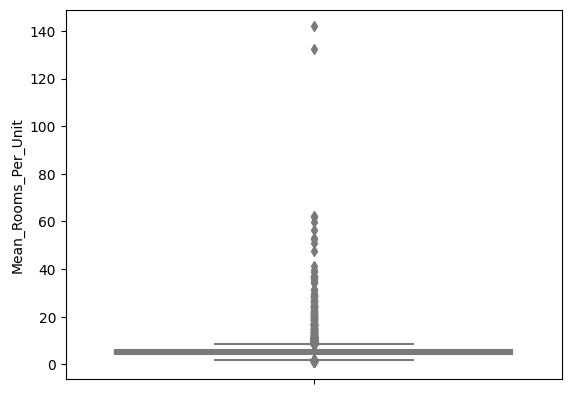

In [14]:
# Mean of Rooms Per Unit concentration
fig = sns.boxplot(data=df_hprices, y="Mean_Rooms_Per_Unit", orient="v", palette = sns.color_palette("pastel"))
plt.show(fig)

Let's analyze the behavior of prices based on the number of rooms in each house. However, it is very likely that there are outliers in the average number of rooms per unit due to the large difference between the 75% and the maximum. Let's check this data.

In [15]:
p01 = df_hprices["Mean_Rooms_Per_Unit"].quantile(0.01)
p05 = df_hprices["Mean_Rooms_Per_Unit"].quantile(0.05)
p10 = df_hprices["Mean_Rooms_Per_Unit"].quantile(0.10)
p90 = df_hprices["Mean_Rooms_Per_Unit"].quantile(0.90)
p95 = df_hprices["Mean_Rooms_Per_Unit"].quantile(0.95)
p97 = df_hprices["Mean_Rooms_Per_Unit"].quantile(0.97)
p98 = df_hprices["Mean_Rooms_Per_Unit"].quantile(0.98)
p99 = df_hprices["Mean_Rooms_Per_Unit"].quantile(0.99)

print("\n","p01:", p01, "\n", "p05:", p05,"\n","p10:", p10,"\n",
      "p90:", p90,"\n","p95:", p95,
      "\n","p97:", p97,
      "\n","p98:", p98,
      "\n","p99:", p99)


 p01: 2.581133407821229 
 p05: 3.4323300062383035 
 p10: 3.7908840214308226 
 p90: 6.961187539828317 
 p95: 7.640246547450425 
 p97: 8.154725108225108 
 p98: 8.61193503573584 
 p99: 10.357033023735815


If we look at 99% of our base we will see that the maximum number for the average number of rooms per unit is 10.35. So to improve our analysis, let's assume that this will be our maximum for the rest of the df from 99%.

In [16]:
df_hprices.loc[df_hprices["Mean_Rooms_Per_Unit"] >= p99, "Mean_Rooms_Per_Unit"] = p99


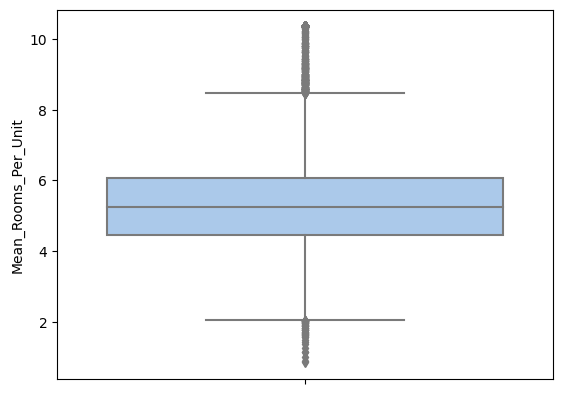

In [17]:
fig = sns.boxplot(data=df_hprices, y="Mean_Rooms_Per_Unit", orient="v", palette = sns.color_palette("pastel"))
plt.show(fig)


Now the distribution makes more sense to build our model, but first lets check some relations between the price, number of rooms and the other columns from our DF.

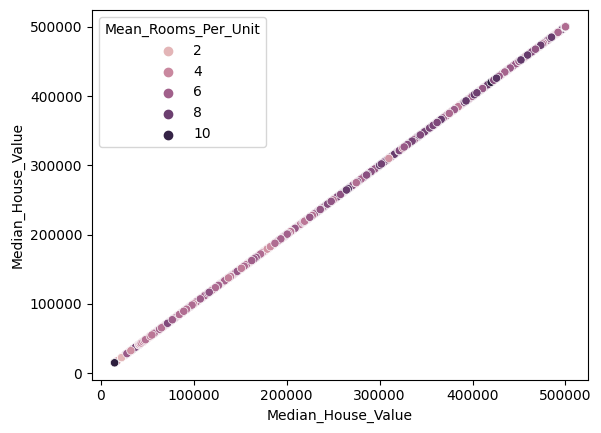

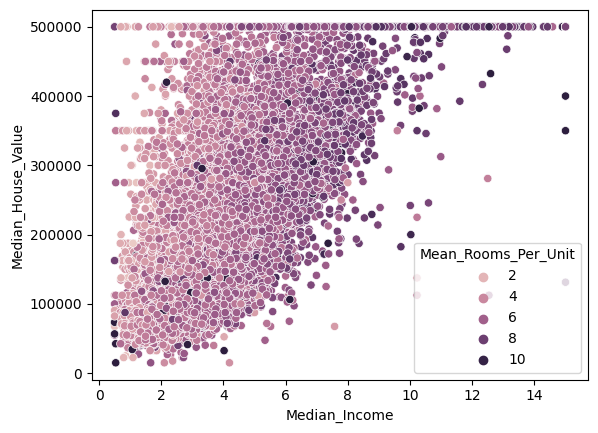

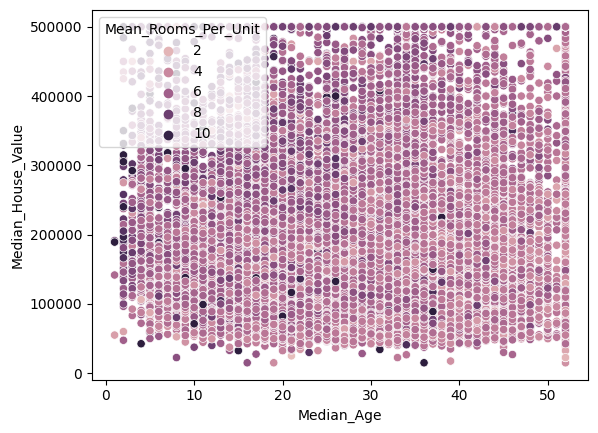

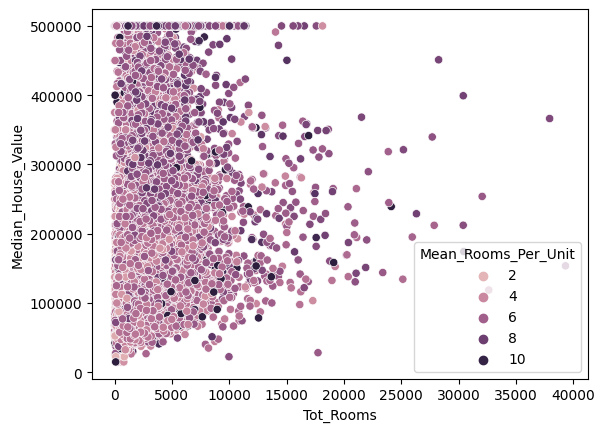

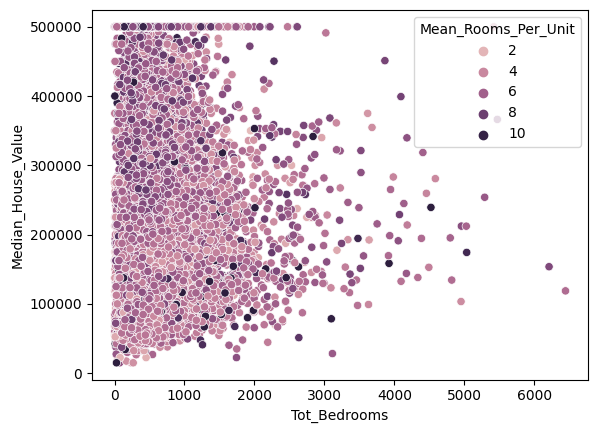

...

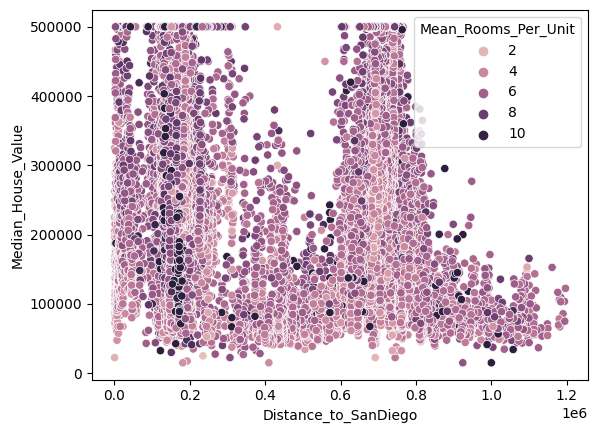

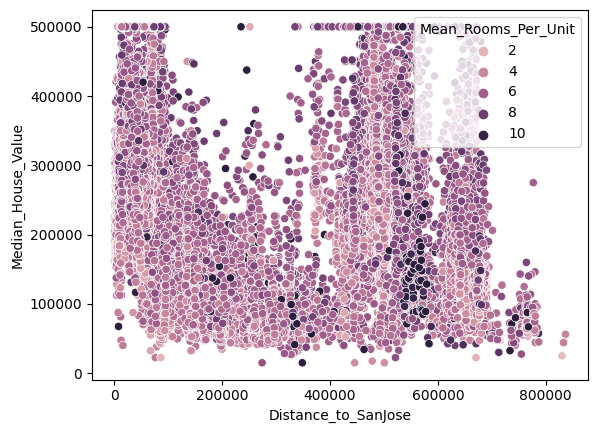

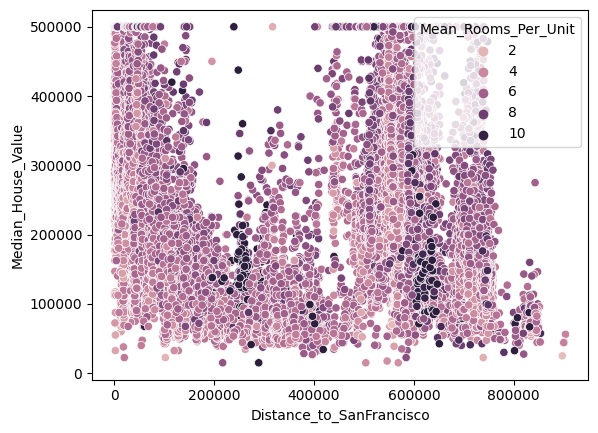

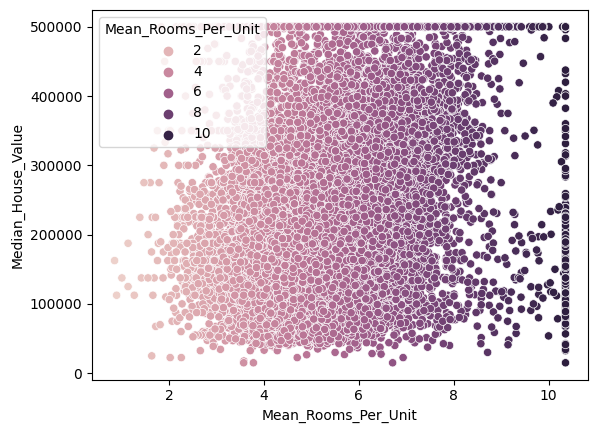

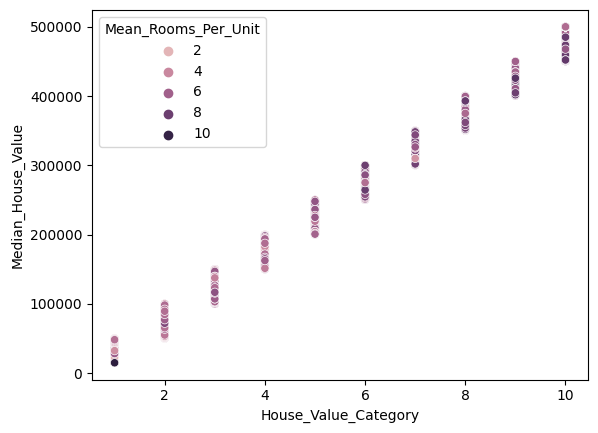

In [18]:
for columns in df_hprices.columns:
    fig = sns.scatterplot(df_hprices, x= columns, y = "Median_House_Value" , hue="Mean_Rooms_Per_Unit")
    plt.show(fig)


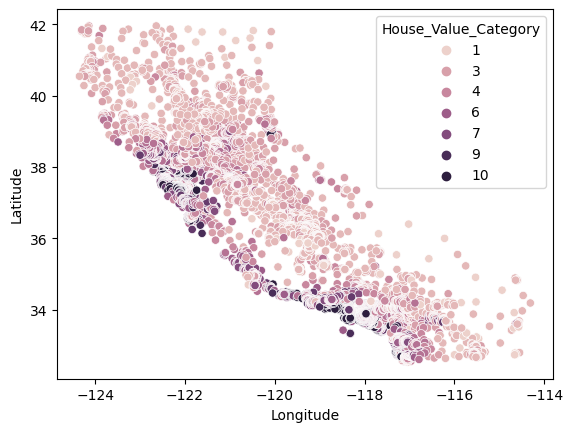

In [25]:
fig = sns.scatterplot(df_hprices, x= "Longitude" , y = "Latitude" , hue="House_Value_Category")
plt.show(fig)


In [26]:
refer_point = [36.778259, -119.417931]
address_map = folium.Map(location=refer_point, zoom_start=11)
colors = LinearColormap(colors=['#9E71A8', '#2F0138'], vmin=df_hprices['House_Value_Category'].min(), vmax=df_hprices['House_Value_Category'].max())

for i in range(df_hprices['House_Value_Category'].size):
    coordinate = [df_hprices.loc[i, 'Latitude'], df_hprices.loc[i, 'Longitude']]
    category = df_hprices.loc[i, 'House_Value_Category']
    circle_color = colors(category)
    circle = folium.Circle(location=coordinate, radius=30, fill=True, color=circle_color)
    address_map.add_child(circle)

address_map

Here we can see some relations between the house price and the distance to the coast, where the farther from the coast prices tend to decrease. We also can see that the higher the family income, the higher the housing prices tend to be. Another interesting relationship is that the prices tend to be lower for properties far from the major hubs of LA, San Diego, San Jose and San Francisco.

# Machine Learning Model - California House Pricing Prediction

First of all lets divide our DF in 2 parts: learning and validation DFs. df_train will have 19640 rows from df_hprices and df_test will have 1000 rows from df_hprices too.

In [27]:
random_indices = np.random.choice(df_hprices.index, size=1000, replace=False)

df_val = df_hprices.loc[random_indices]
df_learn = df_hprices.drop(random_indices)

df_val.reset_index(inplace=True)
df_learn.reset_index(inplace=True)

df_val_real = df_val.House_Value_Category
df_val = df_val.drop(["index", "Median_House_Value", "House_Value_Category"], axis = 1)
df_learn = df_learn.drop(["index", "Median_House_Value"], axis = 1)



display(df_val.head(5))
display(df_learn.head(5))

,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco,Mean_Rooms_Per_Unit
0,2.8793,42,1372,275,674,271,34.05,-118.36,13952.054925,10719.080006,185477.696880,484955.911843,552958.885935,5.062731
1,2.5401,32,3366,676,1916,697,38.13,-121.28,22996.913774,529096.164694,708142.483599,103495.464848,108430.151161,4.829268
2,5.9596,43,1394,321,552,296,33.90,-118.42,5265.806258,23470.860365,176142.059501,494369.022172,562284.853726,4.709459
3,2.7303,22,1891,340,1023,296,39.01,-121.56,103132.328372,625742.105790,804084.716694,188459.749624,157020.050507,6.388514
4,2.1864,29,2677,691,1880,664,38.43,-122.73,28096.097055,631353.198370,810440.058939,142152.221803,77487.874444,4.031627


,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco,Mean_Rooms_Per_Unit,House_Value_Category
0,8.3252,41,880,129,322,126,37.88,-122.23,9263.040773,556529.158342,735501.806984,67432.517001,21250.213767,6.984127,10
1,8.3014,21,7099,1106,2401,1138,37.86,-122.22,10225.733072,554279.850069,733236.884360,65049.908574,20880.600400,6.238137,8
2,7.2574,52,1467,190,496,177,37.85,-122.24,8259.085109,554610.717069,733525.682937,64867.289833,18811.487450,8.288136,8
3,5.6431,52,1274,235,558,219,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568,5.817352,7
4,3.8462,52,1627,280,565,259,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568,6.281853,7


In [28]:
# labels and features
X = df_learn.drop(["House_Value_Category"], axis=1)
Y = df_learn["House_Value_Category"]

our model will learn how to categorize properties into the price ranges of the "House_Value_Category" column (1-10), so we had to exclude the "Median_House_Value" and "House_Value_Category" columns from X.


In [29]:
# training and test data
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 32, stratify = Y)

In [30]:
rf = RandomForestClassifier()
rf.fit(X_train, Y_train)
pred2 = rf.predict(X_test)
acc2 = accuracy_score(Y_test, pred2)

print(f'rf Accuracy:{acc2 * 100:.2f}%')

kn = KNeighborsClassifier()
kn.fit(X_train, Y_train)
pred3 = kn.predict(X_test.to_numpy())
acc3 = accuracy_score(Y_test, pred3)

print(f'kn Accuracy:{acc3 * 100:.2f}%')

rf Accuracy:59.55%
kn Accuracy:51.88%


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


Our random tree model performed better reaching almost 60% of accuracy to classify the price of houses among 10 different categories. So let's test our models with the validation data frame df_val

,real,prediction,result
0,5,5,correct
1,3,2,wrong
2,10,10,correct
3,2,2,correct
4,3,3,correct
...,...,...,...
995,5,6,wrong
996,8,5,wrong
997,4,4,correct
998,7,6,wrong


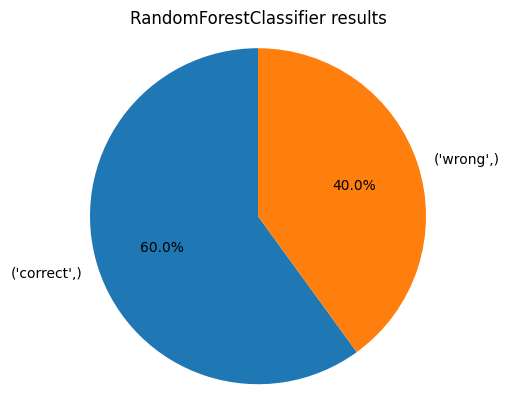

In [31]:
pred = rf.predict(df_val)

df = pd.DataFrame({'real': df_val_real, 'prediction': pred})
df['result'] = df['prediction'] - df['real']
df['result'] = np.where(df['prediction'] == df['real'], "correct", "wrong")

display(df)

df1 = df.value_counts(['result'], normalize=True).map('{:.1}'.format)

fig = plt.pie(df1, labels=df1.index, autopct='%1.1f%%', startangle=90)
plt.title("RandomForestClassifier results")
plt.axis('equal')
plt.show(fig)

,real,prediction,result
0,5,5,correct
1,3,2,wrong
2,10,10,correct
3,2,2,correct
4,3,3,correct
...,...,...,...
995,5,3,wrong
996,8,8,correct
997,4,4,correct
998,7,7,correct


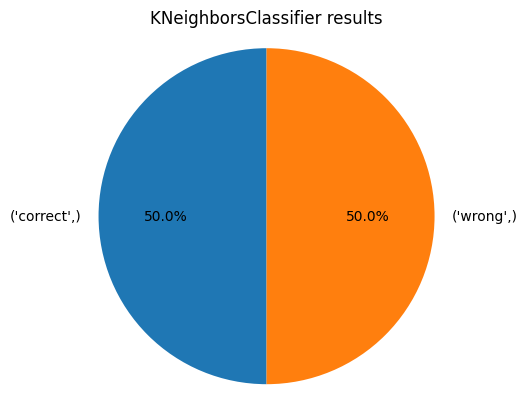

In [32]:
pred = kn.predict(df_val)

df = pd.DataFrame({'real': df_val_real, 'prediction': pred})
df['result'] = df['prediction'] - df['real']
df['result'] = np.where(df['prediction'] == df['real'], "correct", "wrong")

display(df)

df1 = df.value_counts(['result'], normalize=True).map('{:.1}'.format)

fig = plt.pie(df1, labels=df1.index, autopct='%1.1f%%', startangle=90)
plt.title("KNeighborsClassifier results")
plt.axis('equal')
plt.show(fig)